# General experiments

Build/load the full unbalanced attack cache and visualize labels, confidence distributions and drop distribution.

In [1]:
from pathlib import Path
import sys

LAB_ROOT = Path.cwd()
if (LAB_ROOT / "classifier_patch_analysis").exists():
    REPO_ROOT = LAB_ROOT.parent
else:
    REPO_ROOT = LAB_ROOT
    LAB_ROOT = REPO_ROOT / "classifier_experiments"
sys.path.insert(0, str(LAB_ROOT))

In [2]:
from classifier_patch_analysis import ClassifierAttackConfig, ClassifierPatchExperiment, ExperimentConfig

SEED = 17
IMG_SIZE = 224
MODEL_CHECKPOINT = str(REPO_ROOT / "data" / "yolo11-cls-person.pt")
BASE_WEIGHTS = str(REPO_ROOT / "data" / "yolo11s-cls.pt")
PATCH_PATH = str(REPO_ROOT / "data" / "cls_patch.png")
DATASET_PATH = str(REPO_ROOT / "datasets" / "COCO_people_224")
DEVICE = "auto"
BATCH_SIZE = 64
SUCCESS_DROP_THRESHOLD = 0.5
TARGET_LAYER = "model.9"

attack_config = ClassifierAttackConfig(
    dataset_path=DATASET_PATH,
    patch_path=PATCH_PATH,
    checkpoint_path=MODEL_CHECKPOINT,
    base_weights_path=BASE_WEIGHTS,
    output_dir=str(LAB_ROOT / "outputs" / "classifier_patch_analysis"),
    img_size=IMG_SIZE,
    device=DEVICE,
    success_drop_threshold=SUCCESS_DROP_THRESHOLD,
    inference_batch_size=BATCH_SIZE,
    seed=SEED,
)
exp = ClassifierPatchExperiment(ExperimentConfig(attack=attack_config, target_layer=TARGET_LAYER))
exp.output_dir, exp.figures_dir

(PosixPath('/Users/ashentide/PycharmProjects/PatchSuccessResearch/classifier_experiments/outputs/classifier_patch_analysis'),
 PosixPath('/Users/ashentide/PycharmProjects/PatchSuccessResearch/classifier_experiments/outputs/classifier_patch_analysis/figures'))

In [3]:
from classifier_patch_analysis import build_or_load_attack_cache

FORCE_ATTACK_CACHE = False
cache = exp.build_or_load_cache(force=FORCE_ATTACK_CACHE)
cache.to_summary()

{'cache_key': 'ae7ece119c101f0f',
 'n_examples': 5843,
 'n_success': 4284,
 'n_fail': 1559,
 'success_rate': 0.7331850077015232,
 'n_failed': 0,
 'failed_head': [],
 'unbalanced': True}

In [4]:
import pandas as pd

rows = pd.DataFrame([item.to_dict() for item in cache.examples])
display(rows[["success", "drop", "conf_clean", "conf_patch"]].describe())
display(rows["success"].value_counts().rename(index={True: "success", False: "fail"}).to_frame("count"))
rows.to_csv(exp.output_dir / "attack_cache_rows.csv", index=False)

,drop,conf_clean,conf_patch
count,5843.000000,5843.000000,5843.000000
mean,0.657845,0.929461,0.271615
std,0.248797,0.148580,0.266856
min,0.002711,0.002722,0.000009
25%,0.476918,0.944375,0.039864
50%,0.734696,0.984620,0.174407
75%,0.865694,0.995130,0.456718
max,0.987290,0.999885,0.986070


,count
success,
success,4284
fail,1559


PosixPath('/Users/ashentide/PycharmProjects/PatchSuccessResearch/classifier_experiments/outputs/classifier_patch_analysis/figures/general_distributions.png')

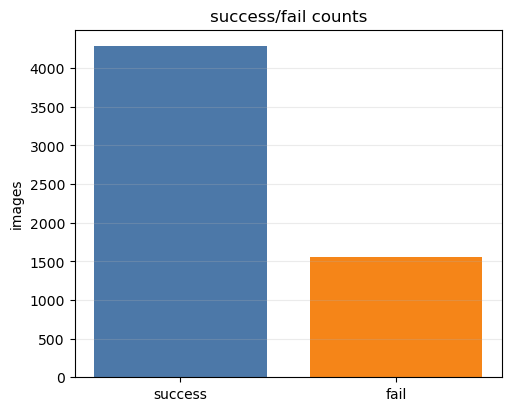

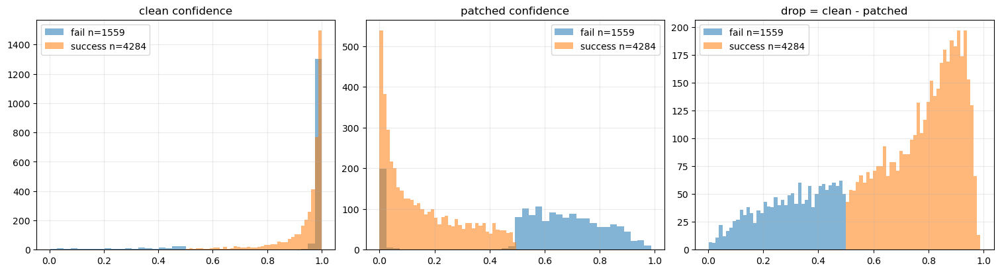

In [5]:
from classifier_patch_analysis.plots import plot_label_counts, plot_attack_distributions, savefig

fig_counts = plot_label_counts(cache)
savefig(fig_counts, exp.figures_dir / "general_label_counts.png")
fig_dist = plot_attack_distributions(cache)
savefig(fig_dist, exp.figures_dir / "general_distributions.png")

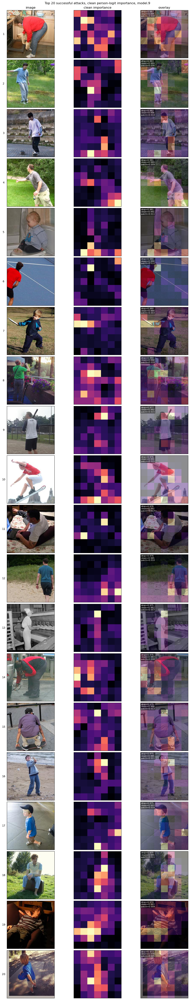

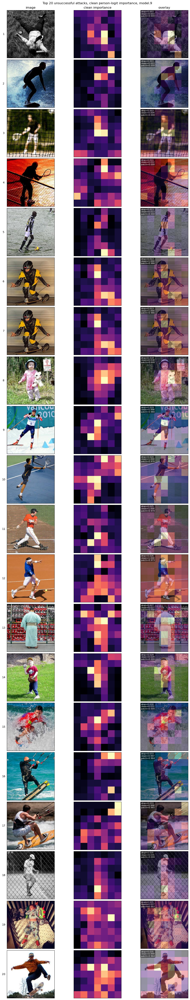

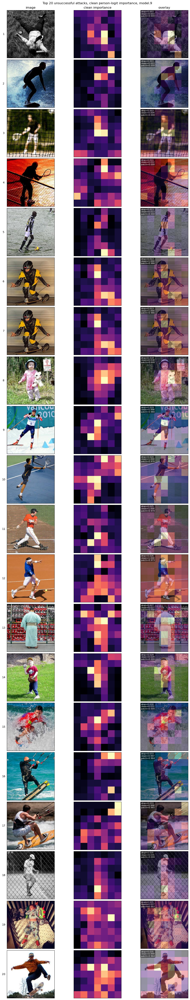

In [6]:
import matplotlib.pyplot as plt
from classifier_patch_analysis.plots import plot_importance_example_grid

IMPORTANCE_LAYER = TARGET_LAYER
N_IMPORTANCE_EXAMPLES = 20

successful_examples = sorted(cache.successes, key=lambda item: item.drop, reverse=True)[:N_IMPORTANCE_EXAMPLES]
unsuccessful_examples = sorted(cache.failures, key=lambda item: item.drop)[:N_IMPORTANCE_EXAMPLES]

fig_success = plot_importance_example_grid(
    exp,
    successful_examples,
    layer_name=IMPORTANCE_LAYER,
    title=f"Top {len(successful_examples)} successful attacks, clean person-logit importance, {IMPORTANCE_LAYER}",
    max_examples=N_IMPORTANCE_EXAMPLES,
)
savefig(fig_success, exp.figures_dir / f"general_success_importance_{IMPORTANCE_LAYER.replace('.', '_')}.png")
display(fig_success)
plt.close(fig_success)

fig_fail = plot_importance_example_grid(
    exp,
    unsuccessful_examples,
    layer_name=IMPORTANCE_LAYER,
    title=f"Top {len(unsuccessful_examples)} unsuccessful attacks, clean person-logit importance, {IMPORTANCE_LAYER}",
    max_examples=N_IMPORTANCE_EXAMPLES,
)
savefig(fig_fail, exp.figures_dir / f"general_fail_importance_{IMPORTANCE_LAYER.replace('.', '_')}.png")
display(fig_fail)

sum_quartile is based on cumulative fraction of total importance mass, not count rank


,rank,channel,y,x,importance_abs_mean,importance_signed_mean,cumulative_importance_frac,sum_quartile
0,1,483,2,3,0.058271,0.043621,0.001193,1
1,2,483,2,4,0.056660,0.040684,0.002353,1
2,3,483,1,6,0.056529,0.042799,0.003510,1
3,4,483,5,3,0.056476,0.039205,0.004666,1
4,5,483,6,6,0.056374,0.043324,0.005820,1
5,6,483,6,2,0.056184,0.045163,0.006970,1
6,7,483,1,3,0.056089,0.041095,0.008119,1
7,8,483,0,6,0.055917,0.043420,0.009263,1
8,9,483,3,3,0.055908,0.041534,0.010408,1
9,10,483,1,5,0.055900,0.042092,0.011552,1


,rank,channel,y,x,importance_abs_mean,importance_signed_mean,cumulative_importance_frac,sum_quartile
0,1,483,3,0,0.053407,0.046404,-0.024674,1
1,2,483,0,0,0.053260,0.045633,-0.048938,1
2,3,483,1,0,0.053952,0.045537,-0.073151,1
3,4,483,2,1,0.052983,0.045305,-0.097241,1
4,5,483,1,1,0.052476,0.045174,-0.121261,1
5,6,483,6,2,0.056184,0.045163,-0.145275,1
6,7,483,2,0,0.053831,0.044963,-0.169183,1
7,8,483,0,1,0.052197,0.044785,-0.192996,1
8,9,483,5,2,0.052558,0.044713,-0.216771,1
9,10,483,6,1,0.055192,0.044609,-0.240490,1


,rank,channel,filter_abs_mean,filter_signed_mean,cumulative_importance_frac,sum_quartile
0,1,483,0.053815,0.042888,0.053982,1
1,2,77,0.018623,0.012392,0.072663,1
2,3,471,0.010889,-0.010080,0.083586,1
3,4,107,0.009267,0.007564,0.092882,1
4,5,295,0.008300,-0.007786,0.101208,1
5,6,19,0.008042,-0.007758,0.109275,1
6,7,102,0.007940,0.006616,0.117240,1
7,8,399,0.007838,0.006932,0.125102,1
8,9,413,0.006263,-0.005305,0.131385,1
9,10,88,0.006138,-0.005757,0.137542,1


,rank,channel,filter_abs_mean,filter_signed_mean,cumulative_importance_frac,sum_quartile
0,1,483,0.053815,0.042888,-1.117411,1
1,2,77,0.018623,0.012392,-1.440272,1
2,3,107,0.009267,0.007564,-1.637342,1
3,4,399,0.007838,0.006932,-1.817954,1
4,5,102,0.007940,0.006616,-1.990337,1
5,6,29,0.005588,0.004197,-2.099682,1
6,7,68,0.004736,0.004001,-2.203925,1
7,8,377,0.004297,0.002820,-2.277387,1
8,9,281,0.002802,0.002444,-2.341065,1
9,10,400,0.003851,0.002337,-2.401949,1


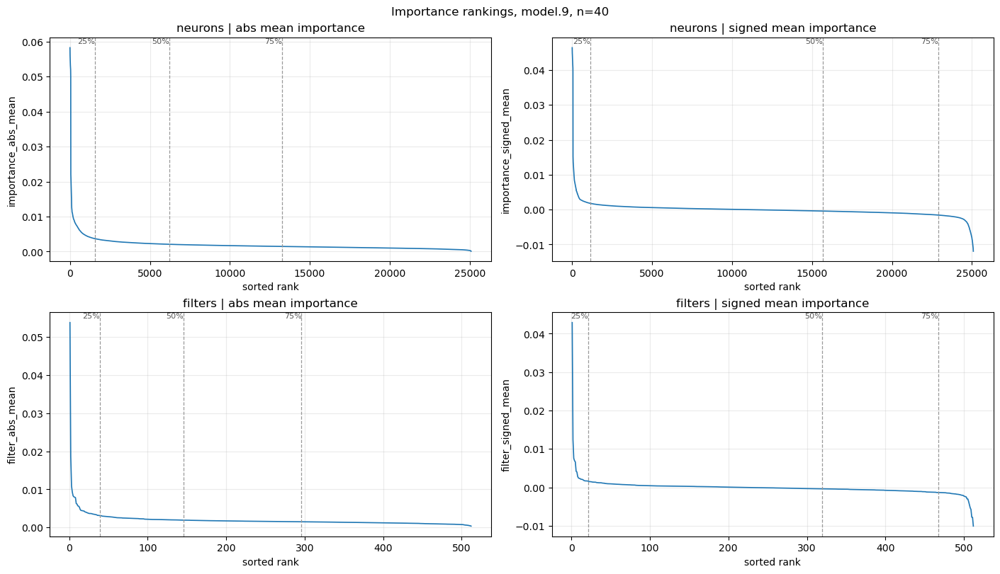

: 

In [ ]:
import matplotlib.pyplot as plt
from classifier_patch_analysis.plots import savefig
from classifier_patch_analysis.importance_analysis import compute_or_load_importance_rankings, plot_importance_rankings

ranking_examples = successful_examples + unsuccessful_examples
rankings = compute_or_load_importance_rankings(
    exp,
    ranking_examples,
    layer_name=IMPORTANCE_LAYER,
    force=False,
)
print(rankings["quartile_definition"])

for name in ["neuron_abs_df", "neuron_signed_df", "filter_abs_df", "filter_signed_df"]:
    df = rankings[name]
    display(df.head(25))
    df.to_csv(exp.output_dir / f"general_importance_{name}_{IMPORTANCE_LAYER.replace('.', '_')}.csv", index=False)

fig = plot_importance_rankings(rankings)
savefig(fig, exp.figures_dir / f"general_importance_rankings_{IMPORTANCE_LAYER.replace('.', '_')}.png")
display(fig)
plt.close(fig)
